## 1. Импорт данных

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

main_df = pd.read_csv(r"X:\TUSUR_LEARNING\HW_2\orders.csv")

products_df = pd.read_csv(r"X:\TUSUR_LEARNING\HW_2\products.csv")

regions_df = pd.read_csv(r"X:\TUSUR_LEARNING\HW_2\regions.csv")

stores_df = pd.read_csv(r"X:\TUSUR_LEARNING\HW_2\stores.csv")

## 2. Просмотр типов данных колонок и ненулевых значений

In [3]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 14 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           20000 non-null  int64  
 1   store_id             20000 non-null  int64  
 2   order_id             20000 non-null  int64  
 3   product_id           20000 non-null  int64  
 4   price                20000 non-null  float64
 5   profit               17911 non-null  float64
 6   delivery_distance    20000 non-null  int64  
 7   date_create          19986 non-null  object 
 8   order_start_prepare  18010 non-null  object 
 9   planned_prep_time    20000 non-null  float64
 10  order_ready          17999 non-null  object 
 11  order_pickup         20000 non-null  object 
 12  region_id            20000 non-null  int64  
 13  status_id            20000 non-null  object 
dtypes: float64(3), int64(6), object(5)
memory usage: 2.1+ MB


## 3. Конвертация колонок в формат datetime

In [4]:
main_df['order_start_prepare'] = pd.to_datetime(main_df['order_start_prepare'])
main_df['order_ready'] = pd.to_datetime(main_df['order_ready'])
main_df

,Unnamed: 0,store_id,order_id,product_id,price,profit,delivery_distance,date_create,order_start_prepare,planned_prep_time,order_ready,order_pickup,region_id,status_id
0,0,5014,20562761,41,7.04,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F
1,1,5014,20562761,31,23.45,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F
2,2,3856,20562753,7,51.94,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F
3,3,3856,20562753,4,188.84,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F
4,4,10825,20562723,12,85.99,43.6080,459,2024-09-05 15:23:32,2024-09-05 15:23:44,20.0,2024-09-05 15:38:38,05-09-2024 16:06:38,683,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19995,7099,20535837,54,6.17,12.1976,3354,2024-09-03 15:02:21,2024-09-03 15:02:27,25.0,2024-09-03 15:27:40,03-09-2024 15:55:40,683,F
19996,19996,4348,20535835,8,17.26,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F
19997,19997,4348,20535835,8,17.26,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F
19998,19998,4348,20535835,63,8.91,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F


## 4. Подсчет количества пропусков

In [5]:
for col in main_df.columns:
    missing = main_df[col].isna().sum()
    print(f'{col}: {missing}')

Unnamed: 0: 0
store_id: 0
order_id: 0
product_id: 0
price: 0
profit: 2089
delivery_distance: 0
date_create: 14
order_start_prepare: 1990
planned_prep_time: 0
order_ready: 2001
order_pickup: 0
region_id: 0
status_id: 0


Исходя из количества пропусков видно, что датасет является таблицей заказов в разных магазинах и соответствующей информации для каждого заказа. Видно, что датафрейм достаточно полный, пропусков некритичное количество, а наибольшее число пропусков находится в столбцах, связанных с готовностью заказов, и в столбце с количеством профита от заказа. Далее мы будем использовать стратегию для избавления от этих пропусков

## 5. Создание новой колонки на основе индекса магазина

проверим датафрейм из stores.csv и добавми колонку store_name в основной датафрейм:

In [6]:
main_df = pd.merge(main_df, stores_df, on='store_id', how='left')
main_df

,Unnamed: 0,store_id,order_id,product_id,price,profit,delivery_distance,date_create,order_start_prepare,planned_prep_time,order_ready,order_pickup,region_id,status_id,store_name
0,0,5014,20562761,41,7.04,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F,KFC на Пушкинской
1,1,5014,20562761,31,23.45,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F,KFC на Пушкинской
2,2,3856,20562753,7,51.94,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F,NaN
3,3,3856,20562753,4,188.84,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F,NaN
4,4,10825,20562723,12,85.99,43.6080,459,2024-09-05 15:23:32,2024-09-05 15:23:44,20.0,2024-09-05 15:38:38,05-09-2024 16:06:38,683,F,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19995,7099,20535837,54,6.17,12.1976,3354,2024-09-03 15:02:21,2024-09-03 15:02:27,25.0,2024-09-03 15:27:40,03-09-2024 15:55:40,683,F,NaN
19996,19996,4348,20535835,8,17.26,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN
19997,19997,4348,20535835,8,17.26,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN
19998,19998,4348,20535835,63,8.91,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN


Сразу проверим количество пропусков в полученной колонке:

In [7]:
name_missing = main_df['store_name'].isna().sum()
name_missing

11943

## 6. Аналогично создаем колонки для product_name и region_name

In [8]:
main_df = pd.merge(main_df, products_df, on='product_id', how='left')
main_df = pd.merge(main_df, regions_df, on='region_id', how='left')
main_df = main_df.rename(columns={'delivery_region_name': 'region_name'})
main_df

,Unnamed: 0,store_id,order_id,product_id,price,profit,delivery_distance,date_create,order_start_prepare,planned_prep_time,order_ready,order_pickup,region_id,status_id,store_name,product_name,region_name
0,0,5014,20562761,41,7.04,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F,KFC на Пушкинской,Nachos,Sovetsky District
1,1,5014,20562761,31,23.45,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F,KFC на Пушкинской,Curry,Sovetsky District
2,2,3856,20562753,7,51.94,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F,NaN,Soup,Sovetsky District
3,3,3856,20562753,4,188.84,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F,NaN,Salad,Sovetsky District
4,4,10825,20562723,12,85.99,43.6080,459,2024-09-05 15:23:32,2024-09-05 15:23:44,20.0,2024-09-05 15:38:38,05-09-2024 16:06:38,683,F,NaN,Sushi,Sovetsky District
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19995,7099,20535837,54,6.17,12.1976,3354,2024-09-03 15:02:21,2024-09-03 15:02:27,25.0,2024-09-03 15:27:40,03-09-2024 15:55:40,683,F,NaN,Fruit Salad,Sovetsky District
19996,19996,4348,20535835,8,17.26,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN,Steak,Sovetsky District
19997,19997,4348,20535835,8,17.26,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN,Steak,Sovetsky District
19998,19998,4348,20535835,63,8.91,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN,Mozzarella Sticks,Sovetsky District


## 7. Пропуски в price

In [9]:
 main_df['price'].isna().sum()

0

Как видно, в данном датафрейме отсутствуют пропуски в колонке price, поэтому заполнять нет необходимости. Однако если бы пропуски были, их можно было бы заполнить следующей командой:

In [10]:
main_df['price'] = main_df['price'].transform(lambda x: x.fillna(x.min()))

## 8. Создание колонки items_count и order_price

In [11]:
main_df['items_count'] = main_df.groupby('order_id')['order_id'].transform('count')
main_df['order_price'] = main_df.groupby('order_id')['price'].transform('sum')
# удаляем колонку price
main_df.drop('price', axis=1, inplace=True)
main_df

,Unnamed: 0,store_id,order_id,product_id,profit,delivery_distance,date_create,order_start_prepare,planned_prep_time,order_ready,order_pickup,region_id,status_id,store_name,product_name,region_name,items_count,order_price
0,0,5014,20562761,41,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F,KFC на Пушкинской,Nachos,Sovetsky District,2,30.49
1,1,5014,20562761,31,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F,KFC на Пушкинской,Curry,Sovetsky District,2,30.49
2,2,3856,20562753,7,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F,NaN,Soup,Sovetsky District,2,240.78
3,3,3856,20562753,4,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F,NaN,Salad,Sovetsky District,2,240.78
4,4,10825,20562723,12,43.6080,459,2024-09-05 15:23:32,2024-09-05 15:23:44,20.0,2024-09-05 15:38:38,05-09-2024 16:06:38,683,F,NaN,Sushi,Sovetsky District,1,85.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19995,7099,20535837,54,12.1976,3354,2024-09-03 15:02:21,2024-09-03 15:02:27,25.0,2024-09-03 15:27:40,03-09-2024 15:55:40,683,F,NaN,Fruit Salad,Sovetsky District,5,102.11
19996,19996,4348,20535835,8,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN,Steak,Sovetsky District,3,43.43
19997,19997,4348,20535835,8,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN,Steak,Sovetsky District,3,43.43
19998,19998,4348,20535835,63,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN,Mozzarella Sticks,Sovetsky District,3,43.43


## 9. Гистограмма для product_name

<Axes: title={'center': 'count'}, xlabel='product_name'>

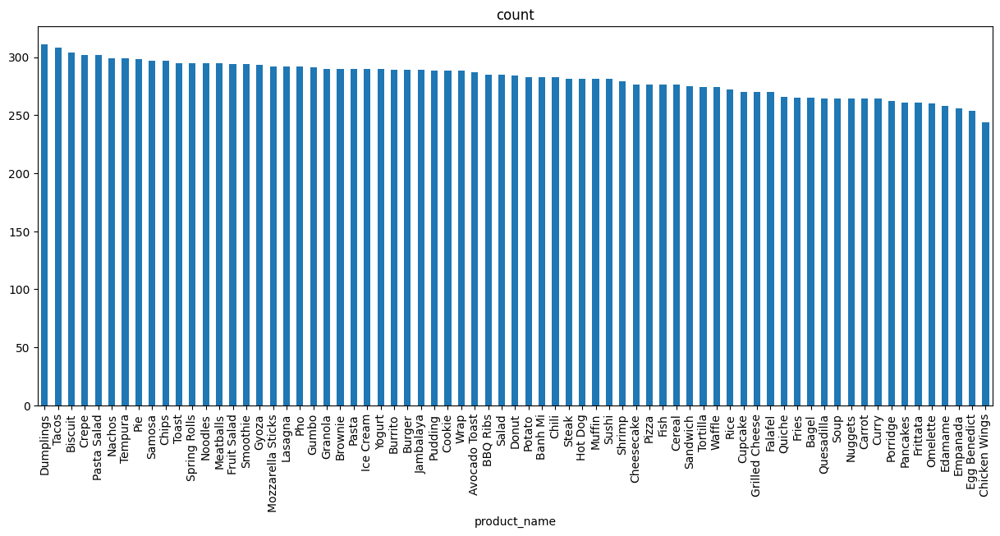

In [12]:
product_counts = main_df['product_name'].value_counts()
plt.figure(figsize=(15, 6))
product_counts.plot(kind='bar', title='count')

Исходя из гистограммы видно, что чаще всего заказывают десерты и национальную кухню разных стран. реже всего заказывают экзотические не распространенные блюда или простую еду, которую можно купить в любом магазине. Однако разница в количестве заказов между самым популярным и самым редким блюдом не велика.

## 10. График плотности для order_price

<Axes: xlabel='order_price', ylabel='Density'>

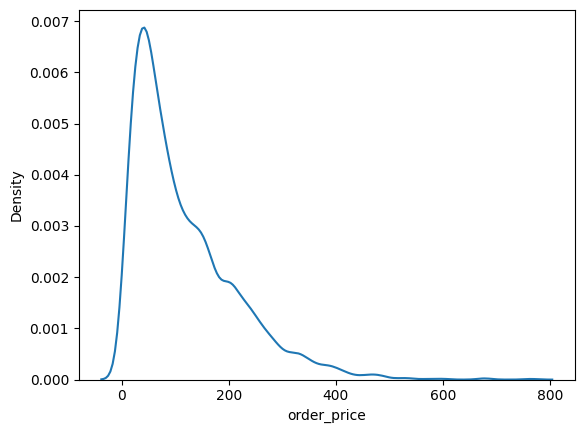

In [13]:
import seaborn as sns

sns.kdeplot(data=main_df, x="order_price")

Из графика видно, что заказы стоимстью до 200 составляют большинство всех заказов. Заказы стоимостью более 500 практически отсутствуют. Это значит, что предпочтительнее заказы с низкой стоимостью, их количество значительно больше остальных

## 11. Удаление product_id и дубликатов

In [14]:
# для дальнейшего удобства, добавим секунды для тех строк, где date_create содержит время с точномтью до минут
main_df['date_create'] = main_df['date_create'].apply(lambda x: f"{x}:00" if isinstance(x, str) and len(x) == 16 else x)
main_df.drop('product_id', axis=1, inplace=True)
main_df.drop_duplicates(subset=['order_id'])

,Unnamed: 0,store_id,order_id,profit,delivery_distance,date_create,order_start_prepare,planned_prep_time,order_ready,order_pickup,region_id,status_id,store_name,product_name,region_name,items_count,order_price
0,0,5014,20562761,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F,KFC на Пушкинской,Nachos,Sovetsky District,2,30.49
2,2,3856,20562753,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F,NaN,Soup,Sovetsky District,2,240.78
4,4,10825,20562723,43.6080,459,2024-09-05 15:23:32,2024-09-05 15:23:44,20.0,2024-09-05 15:38:38,05-09-2024 16:06:38,683,F,NaN,Sushi,Sovetsky District,1,85.99
5,5,5640,20562673,32.8640,2611,2024-09-05 15:19:00,2024-09-05 15:19:05,20.0,2024-09-05 15:35:25,05-09-2024 16:03:25,709,F,NaN,Burrito,Vostochny District,2,24.68
7,7,7283,20562665,11.0600,1041,2024-09-05 15:18:39,NaT,15.0,2024-09-05 15:35:33,05-09-2024 16:03:33,707,F,NaN,Frittata,Kirovsky District,1,14.02
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19984,19984,7557,20535845,50.1650,8046,2024-09-03 15:02:55,2024-09-03 15:03:01,35.0,2024-09-03 15:27:37,03-09-2024 15:55:37,683,F,NaN,Jambalaya,Sovetsky District,5,277.28
19989,19989,4548,20535841,14.6150,2225,2024-09-03 15:01:55,2024-09-03 15:02:04,20.0,2024-09-03 15:17:18,03-09-2024 15:45:18,707,F,NaN,Waffle,Kirovsky District,2,21.05
19991,19991,7099,20535837,12.1976,3354,2024-09-03 15:02:21,2024-09-03 15:02:27,25.0,2024-09-03 15:27:40,03-09-2024 15:55:40,683,F,NaN,Nachos,Sovetsky District,5,102.11
19996,19996,4348,20535835,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN,Steak,Sovetsky District,3,43.43


## 12. Анализ одной пременной

In [15]:
#просмотр статистических показателей колонок
main_df.describe()

,Unnamed: 0,store_id,order_id,profit,delivery_distance,order_start_prepare,planned_prep_time,order_ready,region_id,items_count,order_price
count,20000.000000,20000.00000,2.000000e+04,17911.000000,20000.000000,18010,20000.000000,17999,20000.000000,20000.00000,20000.000000
mean,9999.500000,6709.45050,2.054895e+07,54.920855,4560.104500,2024-09-04 13:22:00.257468160,24.205350,2024-09-04 13:45:02.291405056,690.629700,3.45690,116.251596
min,0.000000,3053.00000,2.053583e+07,0.979600,6.000000,2024-09-03 15:02:04,0.000000,2024-09-03 15:10:42,683.000000,1.00000,1.560000
25%,4999.750000,3970.00000,2.054204e+07,19.434000,2234.750000,2024-09-03 21:50:09,20.000000,2024-09-03 22:11:48,683.000000,2.00000,43.710000
50%,9999.500000,5955.00000,2.054898e+07,38.994400,3763.000000,2024-09-04 14:23:33,25.000000,2024-09-04 14:47:17,685.000000,3.00000,86.950000
75%,14999.250000,9321.00000,2.055533e+07,69.994000,6085.000000,2024-09-04 21:20:25.750000128,30.000000,2024-09-04 21:40:37,695.000000,4.00000,164.260000
max,19999.000000,11963.00000,2.056276e+07,567.615000,32808.000000,2024-09-05 15:25:33,90.000000,2024-09-05 15:39:30,717.000000,15.00000,764.270000
std,5773.647028,2836.42018,7.735068e+03,54.760821,3209.066938,NaN,8.414816,NaN,9.824658,1.86757,96.779117


 Сначала строим гистограммы для всех дискретных признаков:

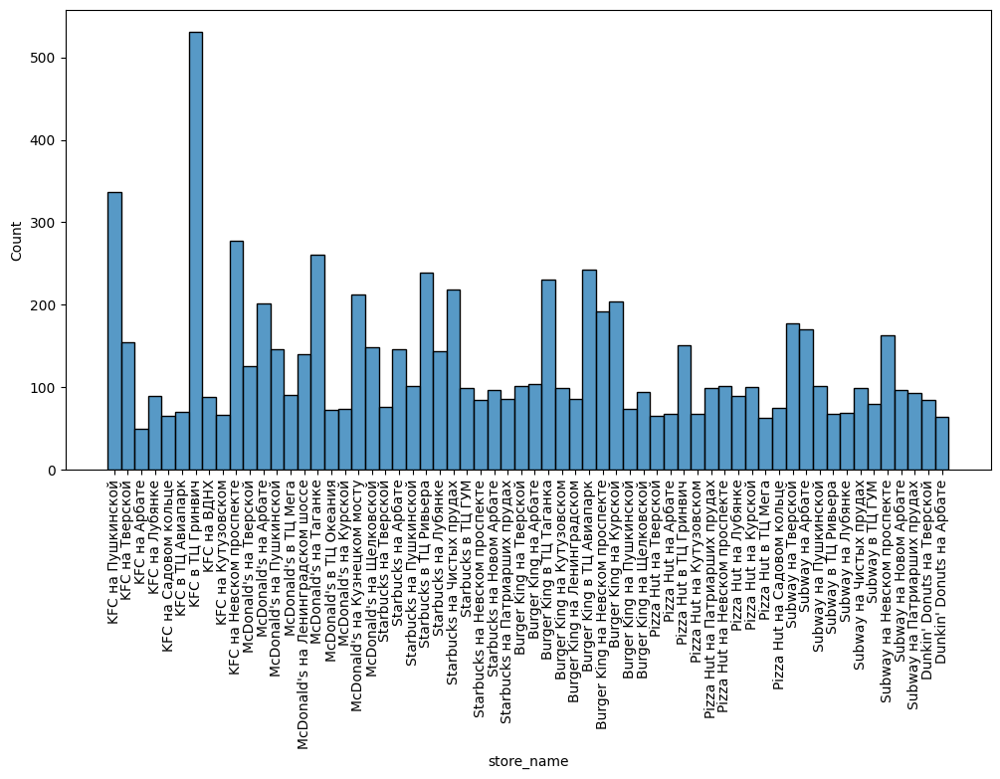

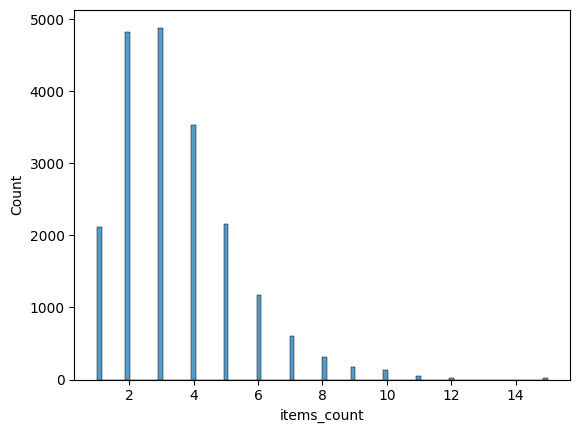

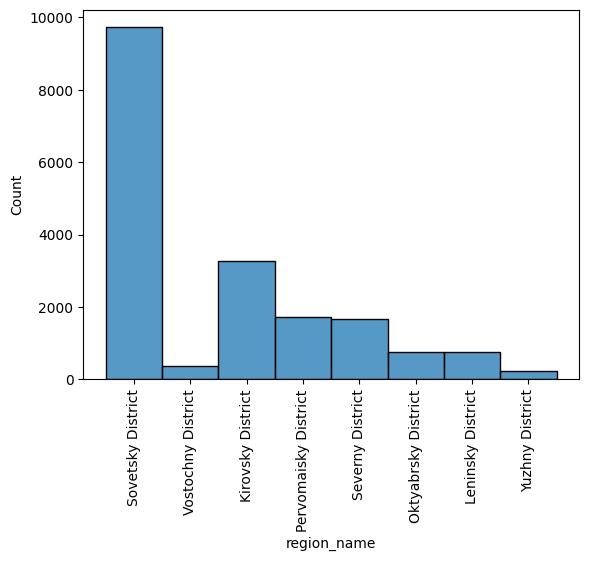

In [16]:
plt.figure(figsize=(12, 6))
sns.histplot(data=main_df, x='store_name')
plt.xticks(rotation=90)
plt.show()


sns.histplot(data=main_df, x='items_count')
plt.show()


sns.histplot(data=main_df, x='region_name')
plt.xticks(rotation=90)
plt.show()

Теперь графики для непрерывных признаков

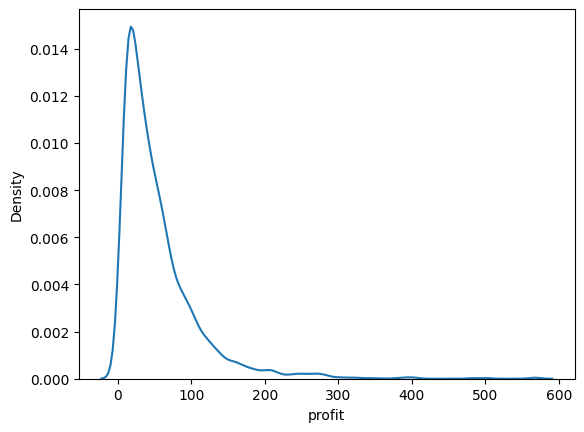

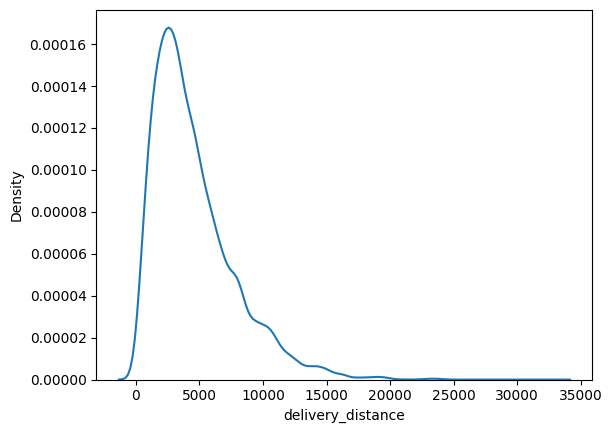

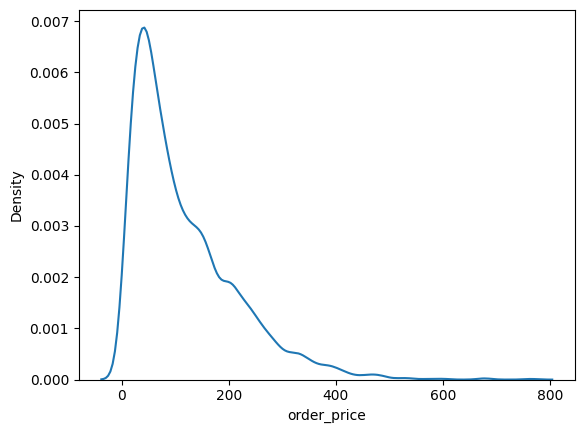

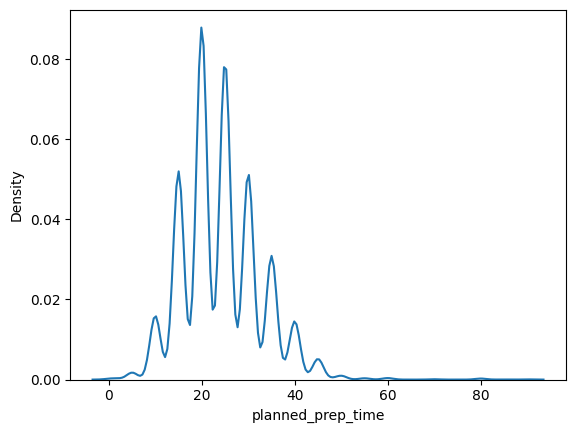

In [17]:
sns.kdeplot(data=main_df, x="profit")
plt.show()

sns.kdeplot(data=main_df, x="delivery_distance")
plt.show()

sns.kdeplot(data=main_df, x="order_price")
plt.show()

sns.kdeplot(data=main_df, x="planned_prep_time")
plt.show()

## Выводы

Исходя из гистограмм и графиков видно, что чаще всего заказывают из KFC в ТЦ Гринвич,  при этом чаще всего в заказе 2 или 3 блюда, а 13 и 14 блюд не встречается вовсе. Советский район наиболее популярен в качестве места доставки, а в Южный доставляют меньше всего.

Наиболее часто профит составляет от 0 до 100, больше 300 профит крайне редкий. Наиболее частое расстояние доставки составляет примерно 3000, а доставка на более чем 20000 практически отсутствует. Цена заказа чаще всего составляет 80-100, а более 500 заказы почти отсутствуют. Запланированное время подготовки имеет пики в 15, 20, 25, 30, 35. Другое время значительн ниже этих показателей.

## 13. Анализ выбросов в данных

In [18]:
import plotly.express as px
numeric_columns = main_df.select_dtypes(include='number').columns
exclude_columns = ['Unnamed: 0', 'store_id', 'order_id', 'product_id', 'region_id', 'items_count']
numeric_columns = numeric_columns.difference(exclude_columns)
fig = px.box(main_df[numeric_columns])
fig.show()

Исходя из boxplot графика видно, что выбросы (точки) присутствуют во всех рассмотренных колонках, однако наиболее выражены выбросы в delivery_distance, т.е. расстояние доставки имеет наибольший разброс в значениях

## 14. Избавление от NaN значений

Из boxplot графика мы знаем, что аномальными являются значения:   
delivery_distance > 11.857k;  
order_price > 344.14;  
planned_prep_time > 45;  
profit > 145.36;  

Для избавления от аномалий будем использовать замену на медианное значение. Замена выбросов на медиану будет уместна, если выбросы случайны и не зависят от других факторов. В данном случае ни одна из колонок, рассмотренных в боксплоте, не зависит от других значений. поэтому можно применить медиану, получив вместо аномальных значений средние для каждой из колонок

In [19]:
Q1 = main_df['delivery_distance'].quantile(0.25)
Q3 = main_df['delivery_distance'].quantile(0.75)
IQR = Q3 - Q1
upper_bound = Q3 + 1.5 * IQR

median_value = main_df['delivery_distance'].median()
main_df.loc[main_df['delivery_distance'] > 11857, 'delivery_distance'] = median_value

median_value2 = main_df['order_price'].median()
main_df.loc[main_df['order_price'] > 344.14, 'order_price'] = median_value2

median_value3 = main_df['planned_prep_time'].median()
main_df.loc[main_df['planned_prep_time'] > 45, 'planned_prep_time'] = median_value3

median_value4 = main_df['profit'].median()
main_df.loc[main_df['profit'] > 145.36, 'profit'] = median_value4

fig = px.box(main_df[numeric_columns])
fig.show()

Теперь избавимся от NaN значений:

In [20]:
for col in main_df.columns:
    missing = main_df[col].isna().sum()
    print(f'{col}: {missing}')

Unnamed: 0: 0
store_id: 0
order_id: 0
profit: 2089
delivery_distance: 0
date_create: 14
order_start_prepare: 1990
planned_prep_time: 0
order_ready: 2001
order_pickup: 0
region_id: 0
status_id: 0
store_name: 11943
product_name: 0
region_name: 1503
items_count: 0
order_price: 0


Чтобы узнать примерное order_start_prepare, будем считать время между созданием заказа и средним временем, через которое началась работа над этим заказом:

In [21]:
main_df['order_start_prepare'] = pd.to_datetime(main_df['order_start_prepare'])
main_df['date_create'] = pd.to_datetime(main_df['date_create'])

mean_diff = (main_df['order_start_prepare'] - main_df['date_create']).mean()

main_df['order_start_prepare'] = main_df['order_start_prepare'].fillna(main_df['date_create'] + mean_diff)

Аналогичная суть избавления от NaN значений в order_ready:

In [22]:
mean_diff = (main_df['order_ready'] - main_df['order_start_prepare']).mean()

main_df['order_ready'] = main_df['order_ready'].fillna(main_df['order_start_prepare'] + mean_diff)

profit (прибыль от заказа) считаем как медиану между разницей значений order_price и profit:

In [23]:
mean_diff = (main_df['order_price'] - main_df['profit']).median()

main_df['profit'] = main_df['profit'].fillna(main_df['order_price'] + mean_diff)

пропуски в date_create устраняем аналогично order_start_prepare, только здаеьс наоборот от order_start_prepare отменяется средняя разница между order_start_prepare и date_create:

In [24]:
mean_diff = (main_df['order_start_prepare'] - main_df['date_create']).mean()

main_df['date_create'] = main_df['date_create'].fillna(main_df['order_start_prepare'] - mean_diff)

In [25]:
for col in main_df.columns:
    missing = main_df[col].isna().sum()
    print(f'{col}: {missing}')

Unnamed: 0: 0
store_id: 0
order_id: 0
profit: 0
delivery_distance: 0
date_create: 0
order_start_prepare: 0
planned_prep_time: 0
order_ready: 0
order_pickup: 0
region_id: 0
status_id: 0
store_name: 11943
product_name: 0
region_name: 1503
items_count: 0
order_price: 0


От пропусков в колонках store_name и region_name, содержащих строки, избавляться нет необходимости. От всех числовых пропусков избавились успешно.

## 15. Целевая переменная

In [26]:
def is_on_time(row):

    actual_time = (row['order_ready'] - row['order_start_prepare']).total_seconds() / 60

    if actual_time < row['planned_prep_time'] + 5:
        return 1 
    else:
        return 0  

main_df['prepared_on_time'] = main_df.apply(is_on_time, axis=1)

main_df

,Unnamed: 0,store_id,order_id,profit,delivery_distance,date_create,order_start_prepare,planned_prep_time,order_ready,order_pickup,region_id,status_id,store_name,product_name,region_name,items_count,order_price,prepared_on_time
0,0,5014,20562761,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F,KFC на Пушкинской,Nachos,Sovetsky District,2,30.49,1
1,1,5014,20562761,45.5040,2205,2024-09-05 15:25:25,2024-09-05 15:25:33,15.0,2024-09-05 15:32:00,05-09-2024 16:00:00,683,F,KFC на Пушкинской,Curry,Sovetsky District,2,30.49,1
2,2,3856,20562753,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F,NaN,Soup,Sovetsky District,2,240.78,1
3,3,3856,20562753,30.3360,1368,2024-09-05 15:25:12,2024-09-05 15:25:19,10.0,2024-09-05 15:35:50,05-09-2024 16:03:50,683,F,NaN,Salad,Sovetsky District,2,240.78,1
4,4,10825,20562723,43.6080,459,2024-09-05 15:23:32,2024-09-05 15:23:44,20.0,2024-09-05 15:38:38,05-09-2024 16:06:38,683,F,NaN,Sushi,Sovetsky District,1,85.99,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,19995,7099,20535837,12.1976,3354,2024-09-03 15:02:21,2024-09-03 15:02:27,25.0,2024-09-03 15:27:40,03-09-2024 15:55:40,683,F,NaN,Fruit Salad,Sovetsky District,5,102.11,1
19996,19996,4348,20535835,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN,Steak,Sovetsky District,3,43.43,1
19997,19997,4348,20535835,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN,Steak,Sovetsky District,3,43.43,1
19998,19998,4348,20535835,49.2960,2129,2024-09-03 15:01:24,2024-09-03 15:03:49,30.0,2024-09-03 15:20:34,03-09-2024 15:48:34,683,F,NaN,Mozzarella Sticks,Sovetsky District,3,43.43,1


## 16. Корреляция между всеми числовыми признаками

<Axes: >

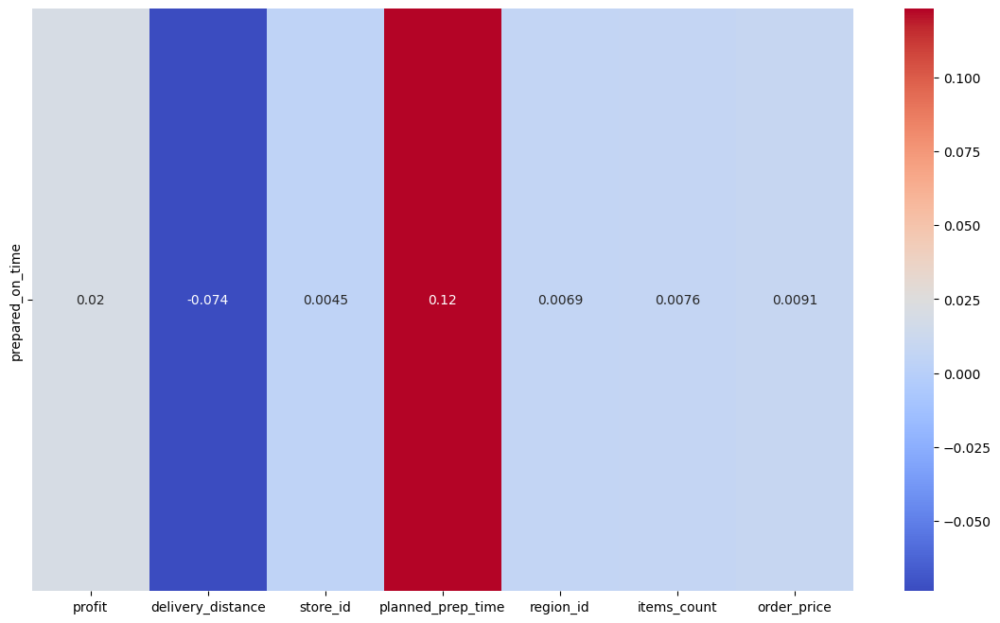

In [27]:
df_corr = main_df[['profit', 'delivery_distance', 'store_id', 'planned_prep_time', 'region_id', 'items_count', 'order_price', 'prepared_on_time']].copy()

corr = df_corr.corr()
target_corr = corr[['prepared_on_time']].drop('prepared_on_time').transpose()

plt.figure(figsize=(14, 8))
sns.heatmap(target_corr, annot=True, cmap='coolwarm')

Используя корреляцию Пирсона в методе corr() всех числовых признаков и prepared_on_time, положительной или отрицательной сильной корреляции выявлено не было. наибольшая корреляция наблюдается с признаком planned_prep_time, что логично, так как этот признак является запланированным временем на готовку заказа, а prepared_on_time отвечает за то, был ли приготовлен заказ вовремя.

## 17. Выводы

После применения стратегий по избавлению от аномалий и NaN-значений, были убраны пропуски и выбросы в датафрейме, что видно на втором boxplot графике и на выводе всех оставшихся пропусков в датафрейме. Целевая переменная равна 1, если заказ был выполнен вовремя - actual_time оказался меньше чем planned_prep_time + 5 минут, и 0 - иначе. Была рассмотрена линейная корреляция prepared_on_time и всех остальных числовых признаков, однако сильной корреляции выявлено не было. 

In [28]:
main_df.to_csv('df.csv')